In [1]:
from echolab2.instruments import EK80, EK60
from echolab2.plotting.matplotlib import echogram

import numpy as np
import xarray as xr
from matplotlib import pyplot as plt, ticker
from matplotlib.colors import LinearSegmentedColormap, Colormap
from matplotlib.pyplot import figure, show, subplots_adjust, get_cmap

import zarr
import os.path
from scipy.signal import chirp, sweep_poly

In [2]:
# Prepare simrad cmap
simrad_color_table = [(1, 1, 1),
                                    (0.6235, 0.6235, 0.6235),
                                    (0.3725, 0.3725, 0.3725),
                                    (0, 0, 1),
                                    (0, 0, 0.5),
                                    (0, 0.7490, 0),
                                    (0, 0.5, 0),
                                    (1, 1, 0),
                                    (1, 0.5, 0),
                                    (1, 0, 0.7490),
                                    (1, 0, 0),
                                    (0.6509, 0.3255, 0.2353),
                                    (0.4705, 0.2353, 0.1568)]
simrad_cmap = (LinearSegmentedColormap.from_list
                             ('Simrad', simrad_color_table))
simrad_cmap.set_bad(color='grey')


In [3]:
# Detect FileType
def ek_detect(fname):
    with open(fname, 'rb') as f:
        file_header = f.read(8)
        file_magic = file_header[-4:]
        if file_magic.startswith(b'XML'):
            return "EK80"
        elif file_magic.startswith(b'CON'):
            return "EK60"
        else:
            return None

In [4]:
def ek_read(fname):
    if ek_detect(fname) == "EK80":
        ek80_obj = EK80.EK80()
        ek80_obj.read_raw(fname)
        return ek80_obj
    elif ek_detect(fname) == "EK60":
        ek60_obj = EK60.EK60()
        ek60_obj.read_raw(fname)
        return ek60_obj

In [5]:
# File collections
dir = os.path.expanduser("~/IMR/echo-test/hackathon/")

files = ['CRIMAC_2020_EK80_CW_DemoFile_GOSars.raw',
'CRIMAC_2020_EK80_FM_DemoFile_GOSars.raw',
'2017843-D20170426-T115044.raw']

# Select a file
raw_obj = ek_read(dir + files[0])
#raw_obj = ek_read(dir + files[1]) ## Doesn't work, EK80-FM
#raw_obj = ek_read(dir + files[2])

In [6]:
print(raw_obj)

<class 'echolab2.instruments.EK80.EK80'> at 0x11186b7c0
    EK80 object contains data from 6 channels:
        WBT 714581-15 ES18_ES :: complex-CW (148, 24213, 4)
        WBT 714596-15 ES38-7_ES :: complex-CW (148, 14124, 4)
        WBT 714590-15 ES70-7C_ES :: complex-CW (148, 14124, 4)
        WBT 714583-15 ES120-7C_ES :: complex-CW (148, 13559, 4)
        WBT 714605-15 ES200-7C_ES :: complex-CW (148, 12712, 4)
        WBT 714597-15 ES333-7C_ES :: complex-CW (148, 8475, 4)
    data start time: 2020-11-21T17:13:03.494
      data end time: 2020-11-21T17:15:59.874
    number of pings: 148



In [7]:
# Switch for aiding the data storage
da_set = False

for chan in list(raw_obj.raw_data.keys()):
    # Getting raw data for a frequency
    raw_data = raw_obj.raw_data[chan][0]
    # Get calibration object
    cal_obj = raw_data.get_calibration()
    # Get sv values
    sv_obj = raw_data.get_sv(calibration = cal_obj)
    # Get sv as depth
    sv_obj_as_depth = raw_data.get_sv(calibration = cal_obj,
        return_depth=True)

    # Get frequency label
    freq = sv_obj.frequency

    # Expand sv values into a 3d object
    data3d = np.expand_dims(sv_obj.data, axis=0)

    # This is the sv data in 3d    
    sv = xr.DataArray(name="sv", data=data3d, dims=['frequency', 'ping_time', 'range'],
                           coords={ 'frequency': [freq],
                                    'ping_time': sv_obj.ping_time,
                                    'range': sv_obj.range,
                                   })
    # This is the depth data
    depth = xr.DataArray(name="depth", data=np.expand_dims(sv_obj_as_depth.depth, axis=0), dims=['frequency', 'range'],
                           coords={ 'frequency': [freq],
                                    'range': sv_obj.range,
                                   })

    # Create mask (for rapid nan filter later)
    ping_mask = xr.DataArray(name="ping_mask", data=True, dims=['frequency', 'ping_time'],
                           coords={ 'frequency': [freq],
                                    'ping_time': sv_obj.ping_time,
                                   })
    range_mask = xr.DataArray(name="range_mask", data=True, dims=['frequency', 'range'],
                           coords={ 'frequency': [freq],
                                    'range': sv_obj.range,
                                   })

    # Combine frequencies if not the first loop iteraton
    if da_set:
        da_sv = xr.concat([da_sv, sv], dim='frequency')
        da_depth = xr.concat([da_depth, depth], dim='frequency')
        da_ping_mask = xr.concat([da_ping_mask, ping_mask], dim='frequency')
        da_range_mask = xr.concat([da_range_mask, range_mask], dim='frequency')
    else:        
        da_sv = sv
        da_depth = depth
        da_ping_mask = ping_mask
        da_range_mask = range_mask
        da_set = True

# Getting motion data
obj_heave = raw_obj.motion_data.heave
obj_pitch = raw_obj.motion_data.pitch
obj_roll = raw_obj.motion_data.roll
obj_heading = raw_obj.motion_data.heading

In [8]:
# Convert the masks as boolean
da_ping_mask = da_ping_mask.fillna(0).astype(bool)
da_range_mask = da_range_mask.fillna(0).astype(bool)

In [9]:
# The resulting 3d array of sv
da_sv

<xarray.DataArray 'sv' (frequency: 6, ping_time: 148, range: 68842)>
array([[[7.68637411e-03,            nan, 3.18761295e-02, ...,
                    nan, 6.64399395e-09, 7.92911240e-09],
        [7.92612895e-03,            nan, 3.25973957e-02, ...,
                    nan, 7.02149801e-11, 4.38530231e-10],
        [7.97619734e-03,            nan, 3.27927151e-02, ...,
                    nan, 4.21455393e-10, 8.47167100e-10],
        ...,
        [7.73112763e-03,            nan, 3.17692622e-02, ...,
                    nan, 8.48100452e-10, 7.96183008e-10],
        [7.64917278e-03,            nan, 3.18284271e-02, ...,
                    nan, 3.25960982e-10, 4.99653754e-10],
        [8.50836706e-03,            nan, 3.46873045e-02, ...,
                    nan, 5.84163958e-10, 6.43543951e-10]],

       [[1.39086845e+00,            nan,            nan, ...,
         2.39150998e-11,            nan,            nan],
        [1.44394955e+00,            nan,            nan, ...,
         6.57006858e-11,            nan,            nan],
        [1.42426090e+00,            nan,            nan, ...,
         8.95858457e-11,            nan,            nan],
...
        [8.61353919e+01,            nan,            nan, ...,
                    nan,            nan,            nan],
        [8.77945751e+01,            nan,            nan, ...,
                    nan,            nan,            nan],
        [9.04236356e+01,            nan,            nan, ...,
                    nan,            nan,            nan]],

       [[2.75403687e+02, 4.58177826e+02,            nan, ...,
                    nan,            nan,            nan],
        [2.79475000e+02, 4.65929477e+02,            nan, ...,
                    nan,            nan,            nan],
        [2.74364771e+02, 4.56820346e+02,            nan, ...,
                    nan,            nan,            nan],
        ...,
        [2.73213702e+02, 4.56820346e+02,            nan, ...,
                    nan,            nan,            nan],
        [2.92388819e+02, 4.81138125e+02,            nan, ...,
                    nan,            nan,            nan],
        [2.92342389e+02, 4.81023874e+02,            nan, ...,
                    nan,            nan,            nan]]])
Coordinates:
  * range      (range) float64 0.0 0.0177 0.02065 0.0236 ... 500.0 500.0 500.0
  * frequency  (frequency) float64 1.8e+04 3.8e+04 7e+04 1.2e+05 2e+05 3.33e+05
  * ping_time  (ping_time) datetime64[ns] 2020-11-21T17:13:03.494000 ... 2020...

In [10]:
# Getting a frequency (note the NaNs)
da_sv.sel(frequency = "1.8e+04")

<xarray.DataArray 'sv' (ping_time: 148, range: 68842)>
array([[7.68637411e-03,            nan, 3.18761295e-02, ...,
                   nan, 6.64399395e-09, 7.92911240e-09],
       [7.92612895e-03,            nan, 3.25973957e-02, ...,
                   nan, 7.02149801e-11, 4.38530231e-10],
       [7.97619734e-03,            nan, 3.27927151e-02, ...,
                   nan, 4.21455393e-10, 8.47167100e-10],
       ...,
       [7.73112763e-03,            nan, 3.17692622e-02, ...,
                   nan, 8.48100452e-10, 7.96183008e-10],
       [7.64917278e-03,            nan, 3.18284271e-02, ...,
                   nan, 3.25960982e-10, 4.99653754e-10],
       [8.50836706e-03,            nan, 3.46873045e-02, ...,
                   nan, 5.84163958e-10, 6.43543951e-10]])
Coordinates:
  * range      (range) float64 0.0 0.0177 0.02065 0.0236 ... 500.0 500.0 500.0
    frequency  float64 1.8e+04
  * ping_time  (ping_time) datetime64[ns] 2020-11-21T17:13:03.494000 ... 2020...

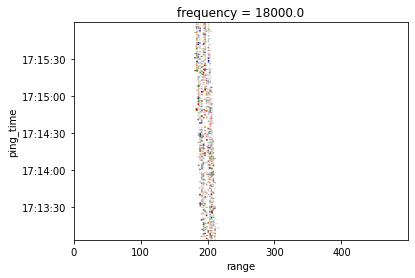

In [11]:
da_sv.sel(frequency = "1.8e+04").plot.contour(robust = True, cmap=simrad_cmap)

In [12]:
# Filtering one frequency back to the raw sv
da_sub_ping_mask = da_ping_mask.sel(frequency = "1.8e+04")
da_sub_range_mask = da_range_mask.sel(frequency = "1.8e+04")
da_sub_sv = da_sv.sel(frequency = "1.8e+04")[da_sub_ping_mask, da_sub_range_mask]
da_sub_sv

<xarray.DataArray 'sv' (ping_time: 148, range: 24213)>
array([[7.68637411e-03, 3.18761295e-02, 1.06834220e-01, ...,
        4.70313970e-09, 6.64399395e-09, 7.92911240e-09],
       [7.92612895e-03, 3.25973957e-02, 1.09218401e-01, ...,
        8.48141877e-11, 7.02149801e-11, 4.38530231e-10],
       [7.97619734e-03, 3.27927151e-02, 1.09014634e-01, ...,
        2.76019341e-10, 4.21455393e-10, 8.47167100e-10],
       ...,
       [7.73112763e-03, 3.17692622e-02, 1.06819409e-01, ...,
        9.97179582e-10, 8.48100452e-10, 7.96183008e-10],
       [7.64917278e-03, 3.18284271e-02, 1.07220589e-01, ...,
        2.53476953e-10, 3.25960982e-10, 4.99653754e-10],
       [8.50836706e-03, 3.46873045e-02, 1.15292702e-01, ...,
        4.73712021e-10, 5.84163958e-10, 6.43543951e-10]])
Coordinates:
  * range      (range) float64 0.0 0.02065 0.0413 0.06195 ... 499.9 500.0 500.0
    frequency  float64 1.8e+04
  * ping_time  (ping_time) datetime64[ns] 2020-11-21T17:13:03.494000 ... 2020...

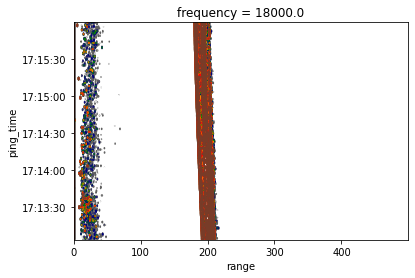

In [13]:
da_sub_sv.plot.contour(robust = True, cmap=simrad_cmap)

In [14]:
# Try to interpolate NaNs
# Select the NaN coordinates
target = ~(da_sub_ping_mask & da_sub_range_mask)
nan_loc = da_sv.sel(frequency = "1.8e+04").where(target, drop = True)

# Interpolate based on the da_sub_sv
interpolated = da_sub_sv.interp(ping_time = nan_loc.ping_time, range = nan_loc.range)

da_sub_sv_interpolated = da_sub_sv.combine_first(interpolated)
da_sub_sv_interpolated

<xarray.DataArray 'sv' (ping_time: 148, range: 68842)>
array([[7.68637411e-03, 2.84204506e-02, 3.18761295e-02, ...,
        6.36774660e-09, 6.64399395e-09, 7.92911240e-09],
       [7.92612895e-03, 2.90729295e-02, 3.25973957e-02, ...,
        7.22929272e-11, 7.02149801e-11, 4.38530231e-10],
       [7.97619734e-03, 2.92474987e-02, 3.27927151e-02, ...,
        4.00755063e-10, 4.21455393e-10, 8.47167100e-10],
       ...,
       [7.73112763e-03, 2.83352434e-02, 3.17692622e-02, ...,
        8.69319311e-10, 8.48100452e-10, 7.96183008e-10],
       [7.64917278e-03, 2.83742484e-02, 3.18284271e-02, ...,
        3.15644122e-10, 3.25960982e-10, 4.99653754e-10],
       [8.50836706e-03, 3.09474568e-02, 3.46873045e-02, ...,
        5.68443017e-10, 5.84163958e-10, 6.43543951e-10]])
Coordinates:
  * range      (range) float64 0.0 0.0177 0.02065 0.0236 ... 500.0 500.0 500.0
    frequency  float64 1.8e+04
  * ping_time  (ping_time) datetime64[ns] 2020-11-21T17:13:03.494000 ... 2020...

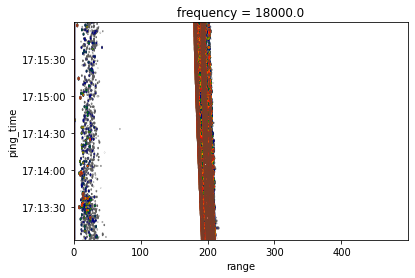

In [15]:
da_sub_sv_interpolated.plot.contour(robust = True, cmap=simrad_cmap)

In [16]:
# Checking to ensure the non-nan values are not replaced (aka. all the values from raw file)
da_sub_sv_interpolated[da_sub_ping_mask, da_sub_range_mask].identical(da_sub_sv)

True

In [17]:
# Crate a dataset
ds = xr.Dataset(
    data_vars=dict(
        sv=(["frequency", "ping_time", "range"], da_sv),
        depth = (["frequency", "range"], da_depth),
        ping_mask=(["frequency", "ping_time"], da_ping_mask),
        range_mask=(["frequency", "range"], da_range_mask),
        heave=(["ping_time"], obj_heave),
        pitch=(["ping_time"], obj_pitch),
        roll=(["ping_time"], obj_roll),
        heading=(["ping_time"], obj_heading),
        ),
    coords=dict(
        frequency = da_sv.frequency,
        ping_time = da_sv.ping_time,
        range = da_sv.range,
        ),
    attrs=dict(description="Multi-frequency sv values from EK."),
)


In [18]:
ds

<xarray.Dataset>
Dimensions:     (frequency: 6, ping_time: 148, range: 68842)
Coordinates:
  * frequency   (frequency) float64 1.8e+04 3.8e+04 7e+04 1.2e+05 2e+05 3.33e+05
  * ping_time   (ping_time) datetime64[ns] 2020-11-21T17:13:03.494000 ... 202...
  * range       (range) float64 0.0 0.0177 0.02065 0.0236 ... 500.0 500.0 500.0
Data variables:
    sv          (frequency, ping_time, range) float64 0.007686 nan ... nan nan
    depth       (frequency, range) float64 8.5 nan 8.521 nan ... nan nan nan nan
    ping_mask   (frequency, ping_time) bool True True True ... True True True
    range_mask  (frequency, range) bool True False True ... False False False
    heave       (ping_time) float32 0.03 0.04 0.02 -0.02 ... -0.01 -0.0 -0.0
    pitch       (ping_time) float32 1.05 0.96 0.95 1.0 ... 1.1 1.11 1.13 1.17
    roll        (ping_time) float32 0.89 0.75 0.62 0.53 ... -0.23 -0.1 -0.05
    heading     (ping_time) float32 177.4 177.4 177.3 ... 202.7 204.1 205.6
Attributes:
    description:  Multi-frequency sv values from EK.

In [19]:
# Save into netcdf
comp = dict(zlib=True, complevel=5)
encoding = {var: comp for var in ds.data_vars}
ds.to_netcdf("EK80_CW_sv_only.nc", encoding=encoding)

In [20]:
# Save into zarr
compressor = zarr.Blosc(cname="zstd", clevel=3, shuffle=2)
encoding = {var: {"compressor" : compressor} for var in ds.data_vars}
ds.to_zarr("EK80_CW_sv_only.zarr", encoding=encoding)

In [21]:
# Try to open them
ds_nc = xr.open_dataset("EK80_CW_sv_only.nc")
ds_zr = xr.open_zarr("EK80_CW_sv_only.zarr")

In [22]:
# Open NetCDF
ds_nc

<xarray.Dataset>
Dimensions:     (frequency: 6, ping_time: 148, range: 68842)
Coordinates:
  * frequency   (frequency) float64 1.8e+04 3.8e+04 7e+04 1.2e+05 2e+05 3.33e+05
  * ping_time   (ping_time) datetime64[ns] 2020-11-21T17:13:03.494000 ... 202...
  * range       (range) float64 0.0 0.0177 0.02065 0.0236 ... 500.0 500.0 500.0
Data variables:
    sv          (frequency, ping_time, range) float64 ...
    depth       (frequency, range) float64 ...
    ping_mask   (frequency, ping_time) bool ...
    range_mask  (frequency, range) bool ...
    heave       (ping_time) float32 ...
    pitch       (ping_time) float32 ...
    roll        (ping_time) float32 ...
    heading     (ping_time) float32 ...
Attributes:
    description:  Multi-frequency sv values from EK.

In [23]:
# Open Zarr
ds_zr

<xarray.Dataset>
Dimensions:     (frequency: 6, ping_time: 148, range: 68842)
Coordinates:
  * frequency   (frequency) float64 1.8e+04 3.8e+04 7e+04 1.2e+05 2e+05 3.33e+05
  * ping_time   (ping_time) datetime64[ns] 2020-11-21T17:13:03.494000 ... 202...
  * range       (range) float64 0.0 0.0177 0.02065 0.0236 ... 500.0 500.0 500.0
Data variables:
    depth       (frequency, range) float64 dask.array<chunksize=(2, 34421), meta=np.ndarray>
    heading     (ping_time) float32 dask.array<chunksize=(148,), meta=np.ndarray>
    heave       (ping_time) float32 dask.array<chunksize=(148,), meta=np.ndarray>
    ping_mask   (frequency, ping_time) bool dask.array<chunksize=(6, 148), meta=np.ndarray>
    pitch       (ping_time) float32 dask.array<chunksize=(148,), meta=np.ndarray>
    range_mask  (frequency, range) bool dask.array<chunksize=(3, 68842), meta=np.ndarray>
    roll        (ping_time) float32 dask.array<chunksize=(148,), meta=np.ndarray>
    sv          (frequency, ping_time, range) float64 dask.array<chunksize=(1, 19, 8606), meta=np.ndarray>
Attributes:
    description:  Multi-frequency sv values from EK.